## Visión por Computadora II
### Carrera de Especialización en Inteligencia Artificial - FIUBA

## Trabajo Práctico Final

### 2º Bimestre 2025

### Grupo

| Autores               | E-mail                    | Nº SIU  |
|---------------------- |---------------------------|---------|
| Braian Desía          | b.desia@hotmail.com       | a1804   |
| Lautaro Medina        | medinalautarog@gmail.com  | a1813   |

# **PLANT DISEASE DETECTION**

El objetivo de este trabajo es construir una red neuronal convolucional (CNN) utilizando Pytorch, capaz de clasificar cuando una planta está enferma o no.

El dataset se encuentra en este link: https://www.kaggle.com/datasets/abdallahalidev/plantvillage-dataset

### 0. LIBRERÍAS GENERALES

In [1]:
# For data manipulation
import numpy as np

# For path manipulation
import os # 

# For visualization
import matplotlib.pyplot as plt

import torch

### 1. EXPLORATORY DATA ANALYSIS

#### 1.1 PRELIMINAR

El dataset presenta 3 carpetas:
- color
- grayscale
- segmented

Esas carpetas tienen, a su vez, subcarpetas con las categorías.

Comparamos la cantidad de archivos en las 3 carpetas, por categoría.

In [2]:
base_dir = './plantvillage dataset/'

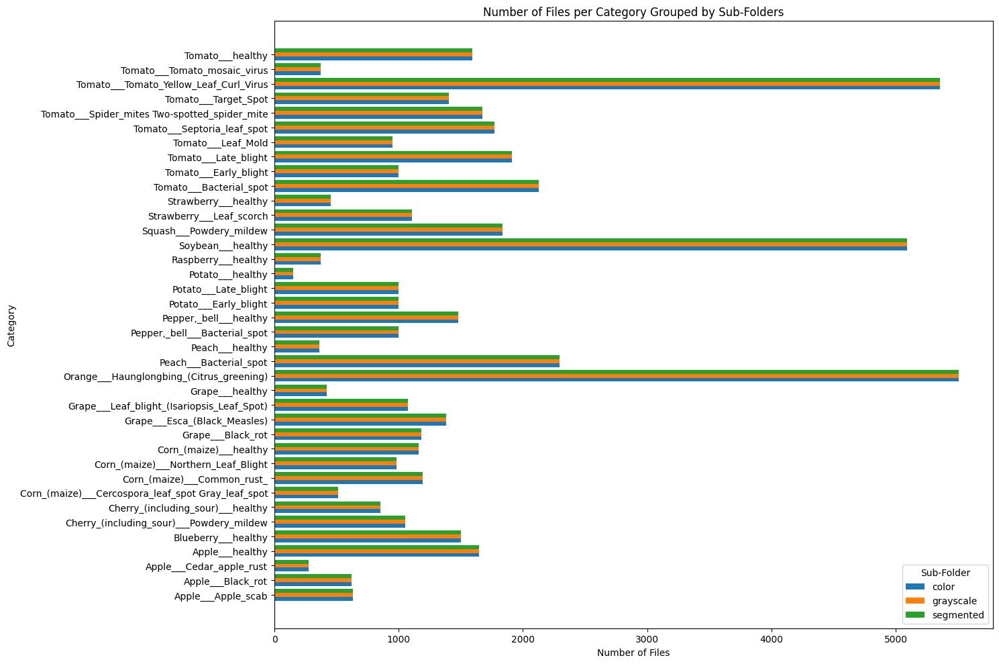

In [3]:
# List sub-folders in the main directory
subfolders = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]

# Initialize dictionary to store data: {sub_subfolder: [file counts per subfolder]}
data = {}

# Iterate over each subfolder
for subc in subfolders:
    subc_path = os.path.join(base_dir, subc)
    # List sub-sub-folders
    sub_subs = [d for d in os.listdir(subc_path) if os.path.isdir(os.path.join(subc_path, d))]
    for sub_sub in sub_subs:
        sub_sub_path = os.path.join(subc_path, sub_sub)
        # Count files in each sub-sub-folder
        files = [f for f in os.listdir(sub_sub_path) if os.path.isfile(os.path.join(sub_sub_path, f))]
        if sub_sub not in data:
            data[sub_sub] = []
        data[sub_sub].append(len(files))

# Sort the sub-sub-folders
sub_subs_sorted = sorted(data.keys())

# Number of groups and bars
num_groups = len(sub_subs_sorted)
num_bars = len(subfolders)

# Create the figure with more height for horizontal bars
fig, ax = plt.subplots(figsize=(15, 10))

# Bar height
total_width = 0.8
bar_height = total_width / num_bars

# Positions on the y-axis
indices = np.arange(num_groups)

# Create horizontal bars
for i, subc in enumerate(subfolders):
    # Get data sorted according to sub_subs_sorted
    values = [data[sub_sub][i] if i < len(data[sub_sub]) else 0 for sub_sub in sub_subs_sorted]
    # Y-position for this set of bars
    pos = indices - total_width/2 + i * bar_height + bar_height/2
    ax.barh(pos, values, height=bar_height, label=subc)

# Configure labels and legend
ax.set_ylabel('Category')
ax.set_xlabel('Number of Files')
ax.set_title('Number of Files per Category Grouped by Sub-Folders')
ax.set_yticks(indices)
ax.set_yticklabels(sub_subs_sorted)
ax.legend(title='Sub-Folder')

plt.tight_layout()
plt.show()

In [4]:
# List to store the names of classes with discrepancies
discrepant_classes = []

# Check if each sub-sub-folder has the same number of files across all sub-folders
all_match = True

for sub_sub in sub_subs_sorted:
    file_counts = data[sub_sub]
    # Verify if all counts are the same
    if len(set(file_counts)) != 1:
        print(f"Mismatch found in class: {sub_sub}")
        discrepant_classes.append(sub_sub)  # Save class with discrepancy
        all_match = False

if all_match:
    print("For each class, all sub-folders have the same number of files.")

Mismatch found in class: Grape___Esca_(Black_Measles)


In [5]:
# Veamos para la clase con la diferencia encontrada
data [discrepant_classes[0]]

[1383, 1383, 1384]

Vemos cual es el archivo que esta de más:

In [6]:
def dataset_folderpath(dataset_name):
    return base_dir + dataset_name + '/'

# List files in each folder
files_folder1 = set(os.listdir(dataset_folderpath('color/' + discrepant_classes[0])))
files_folder2 = set(os.listdir(dataset_folderpath('segmented/' + discrepant_classes[0])))

# Create a set for filenames without extension or suffix
mask_suffix = '_final_masked'

files_folder2_without_mask = set()

for filename in files_folder2:
    # Remove the extension
    base_name, ext = os.path.splitext(filename)
    # Remove the suffix
    base_name = base_name[:-len(mask_suffix)]
    files_folder2_without_mask.add(base_name)

files_folder1_names = set()
for filename in files_folder1:
    name, ext = os.path.splitext(filename)
    files_folder1_names.add(name)

# Count matches
matches = files_folder1_names.intersection(files_folder2_without_mask)
non_matches = files_folder1_names.symmetric_difference(files_folder2_without_mask)

print(f"Number of files with the same name: {len(matches)}")
print(f"Number of files without a match: {len(non_matches)}")
print('')

non_matching_files = [filename for filename in non_matches]
print("Files in folder2 with no corresponding match in folder1:")
for filename in non_matches:
    print(filename)

Number of files with the same name: 1383
Number of files without a match: 1

Files in folder2 with no corresponding match in folder1:
7e1fd9b9-1fd9-4f98-93f5-8cf9ebc60dd9___FAM_B.Msls 4430


**OBSERVACIONES:**

- Con excepción de la clase "Grape__Esca_(Black_Measles)", se infiere que cada sub-carpeta, presenta los mismos casos por clase pero diferenciandose en que las imagenes están a color, en escala de grises y segmentadas, respectivamente.

- Para la clase "Grape__Esca_(Black_Measles)", la sub-carpeta "segmented" presenta 1 archivo más respecto de las otras 2 carpetas.

#### 1.1 DATA ANALYSIS

Cargamos los datasets:

In [7]:
from torchvision import datasets

# Cargar los diferentes datasets
dataset_color = datasets.ImageFolder(root = dataset_folderpath('color'))
dataset_gray = datasets.ImageFolder(root = dataset_folderpath('grayscale'))
dataset_seg = datasets.ImageFolder(root = dataset_folderpath('segmented'))

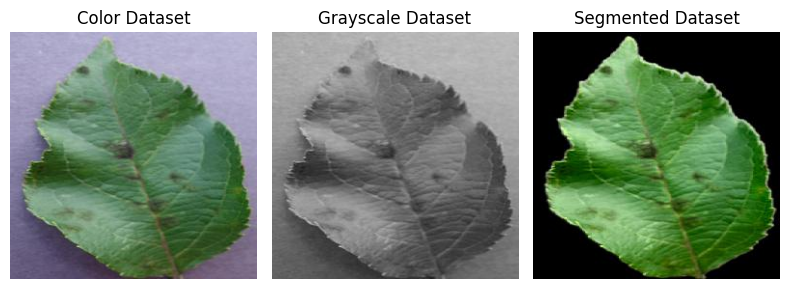

In [8]:
# Function to display a list of images in a row
def show_images_in_row(images, titles):
    fig, axes = plt.subplots(1, len(images), figsize=(8, 5))
    if len(images) == 1:
        axes = [axes]
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img)
        ax.set_title(title)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Sample one image from each dataset
images = []
titles = ['Color Dataset', 'Grayscale Dataset', 'Segmented Dataset']
samples = [
    dataset_color,
    dataset_gray,
    dataset_seg
]

for dataset in samples:
    image, label = dataset[0]
    images.append(image)

# Show all three images in a row
show_images_in_row(images, titles)



**OBSERVACIONES:**

- Se asume a la carpeta "color" como la original sin procesamiento, siendo "grayscale" y "segmented" versiones procesadas de esta carpeta.

- Dado que nuestro interes está en analizar la hoja en si y su fondo no aporta valor alguno, utilizar el conjunto con la imagen segmentada resulta atractivo.

Veamos el tamaño de las imágenes del dataset:

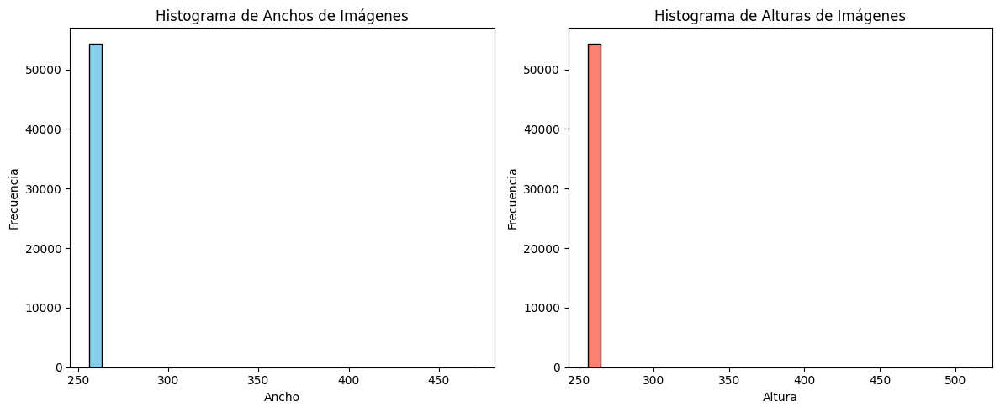

Ancho mínimo: 256, Ancho máximo: 470
Altura mínima: 256, Altura máxima: 512


In [9]:
# Variables para almacenar dimensiones
widths = []
heights = []

# Inicializar las alturas y anchuras
min_height = float('inf')
max_height = float('-inf')
min_width = float('inf')
max_width = float('-inf')

# Iterar sobre el conjunto de datos para recolectar dimensiones
for img, label in dataset:
    width, height = img.size
    widths.append(width)
    heights.append(height)

min_width = min(widths)
max_width = max(widths)
min_height = min(heights)
max_height = max(heights)

# Graficar histograma de anchos
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.hist(widths, bins=30, color='skyblue', edgecolor='black')
plt.title('Histograma de Anchos de Imágenes')
plt.xlabel('Ancho')
plt.ylabel('Frecuencia')

# Graficar histograma de alturas
plt.subplot(1, 2, 2)
plt.hist(heights, bins=30, color='salmon', edgecolor='black')
plt.title('Histograma de Alturas de Imágenes')
plt.xlabel('Altura')
plt.ylabel('Frecuencia')

plt.tight_layout()
plt.show()

print(f"Ancho mínimo: {min_width}, Ancho máximo: {max_width}")
print(f"Altura mínima: {min_height}, Altura máxima: {max_height}")

**OBSERVACIONES:**

- Todas las imágenes tienen el mismo ancho y altura: 256 x 256.

- La relación de aspecto es 1.

In [10]:
nclasses = len(dataset_color.classes)
class_names = dataset_color.classes

print("La cantidad de clases es: ", nclasses)
print("Las clases son: ", class_names)
print("Índice a Clase: ", dataset_color.class_to_idx)

La cantidad de clases es:  38
Las clases son:  ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mite

**OBSERVACIONES:**

- Las clases tienen la siguiente nomenclatura {PLANTA} + ___ + {CONDICIÓN}

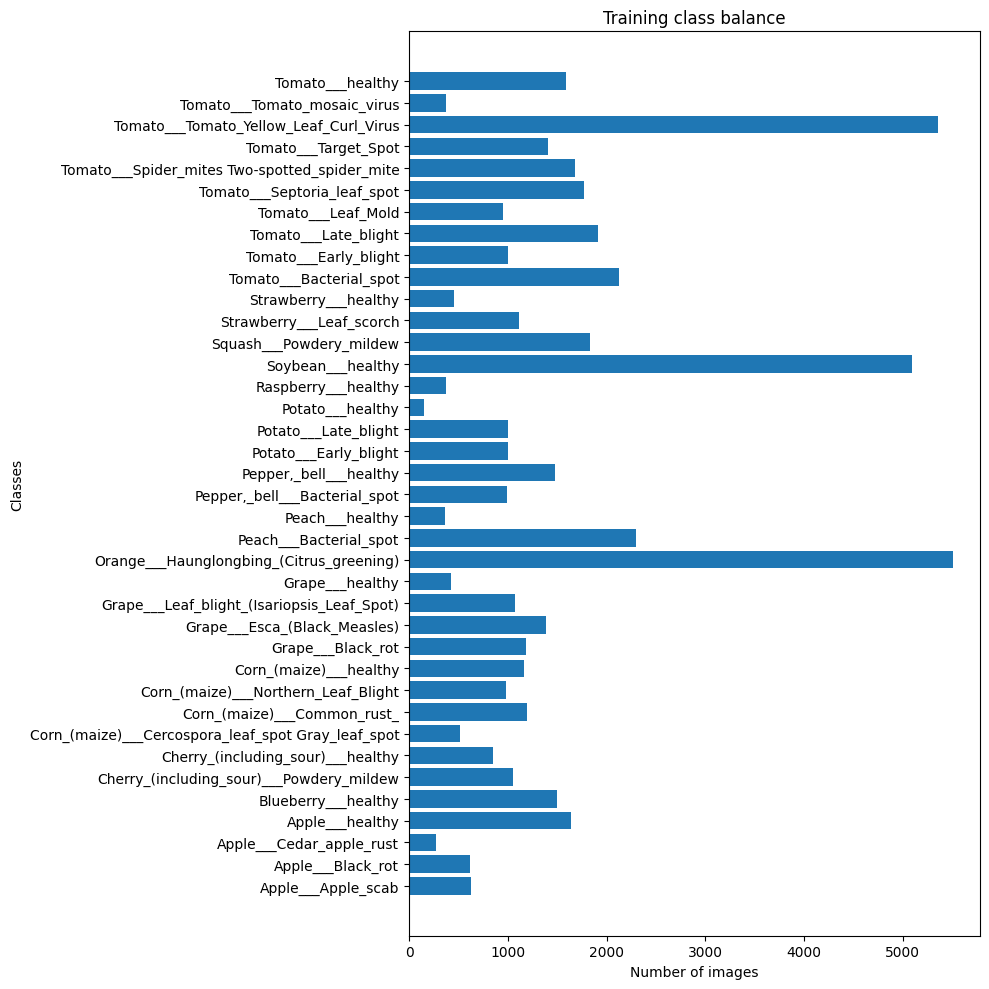

In [11]:
from collections import Counter

# Count the classes in the training set
class_names = dataset_color.classes
class_counts = Counter(sample[1] for sample in dataset_color.samples)

# Get class names and their counts
classes = [class_names[i] for i in range(len(class_names))]
counts = [class_counts[i] for i in range(len(class_names))]

# Create the horizontal bar chart
plt.figure(figsize=(10, 10))
plt.barh(classes, counts)
plt.title('Training class balance')
plt.xlabel('Number of images')
plt.ylabel('Classes')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

**OBSERVACIONES:**

- Vemos que hay un desbalance notorio de clases.

Sampleamos algunas imagenes por clase

Apple___Apple_scab


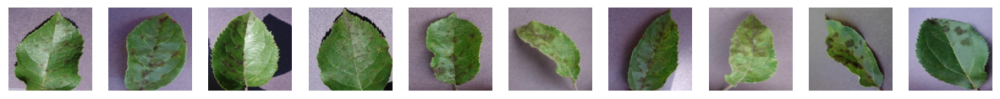

Apple___Black_rot


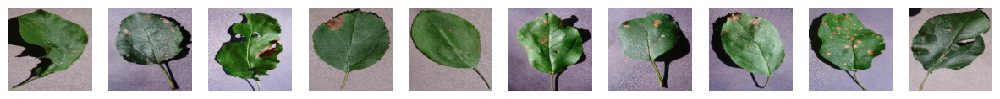

Apple___Cedar_apple_rust


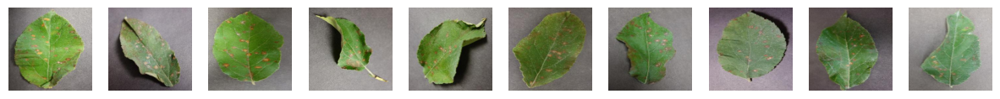

Apple___healthy


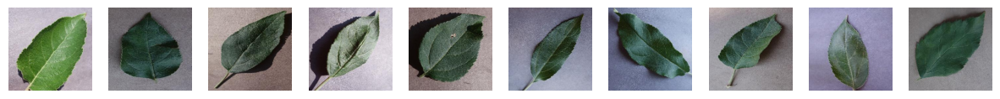

Blueberry___healthy


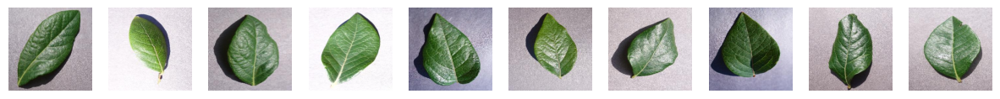

Cherry_(including_sour)___Powdery_mildew


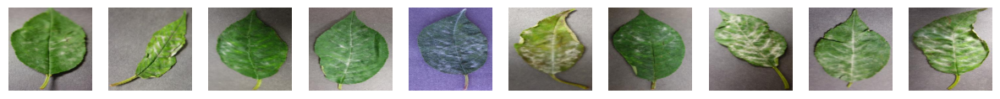

Cherry_(including_sour)___healthy


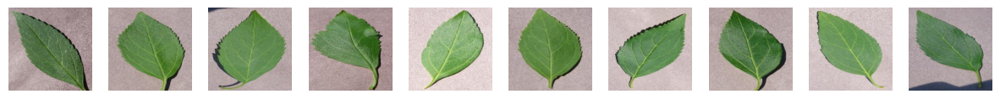

Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot


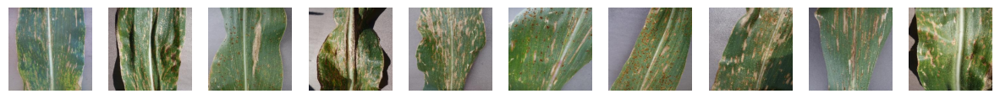

Corn_(maize)___Common_rust_


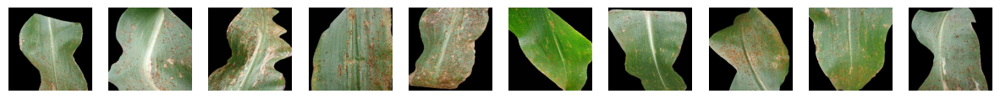

Corn_(maize)___Northern_Leaf_Blight


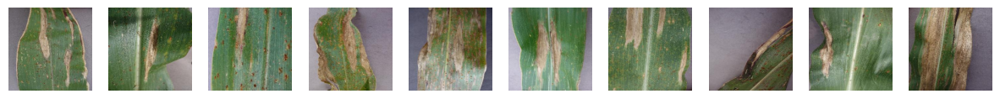

Corn_(maize)___healthy


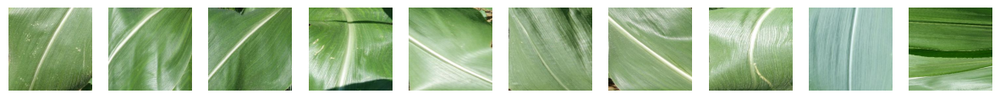

Grape___Black_rot


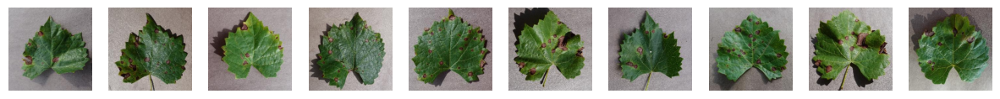

Grape___Esca_(Black_Measles)


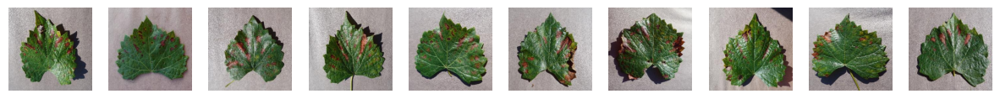

Grape___Leaf_blight_(Isariopsis_Leaf_Spot)


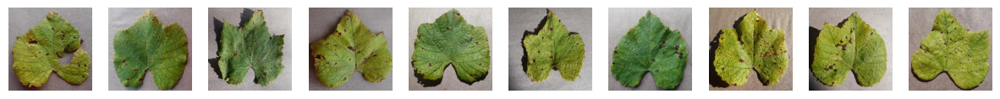

Grape___healthy


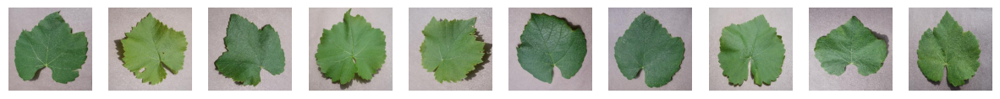

Orange___Haunglongbing_(Citrus_greening)


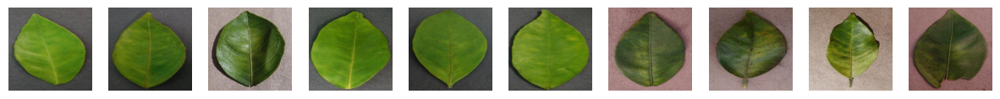

Peach___Bacterial_spot


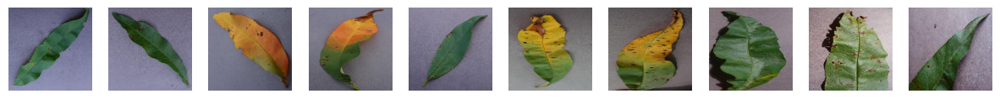

Peach___healthy


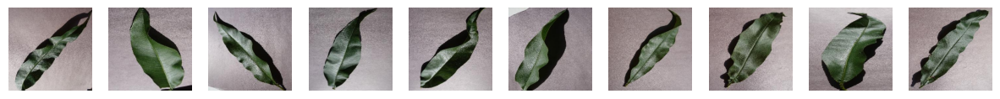

Pepper,_bell___Bacterial_spot


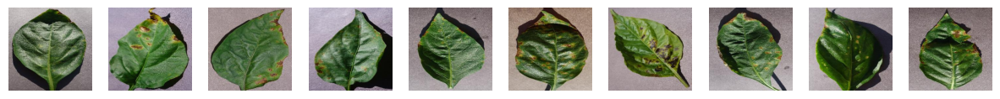

Pepper,_bell___healthy


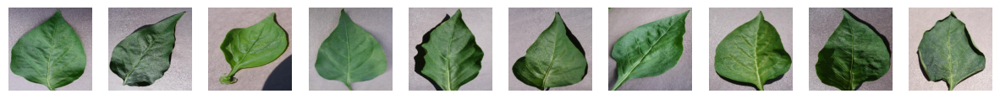

Potato___Early_blight


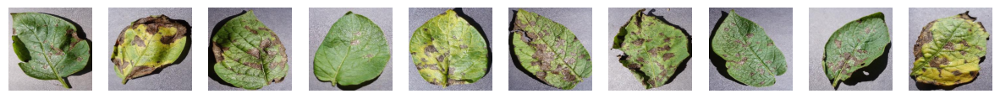

Potato___Late_blight


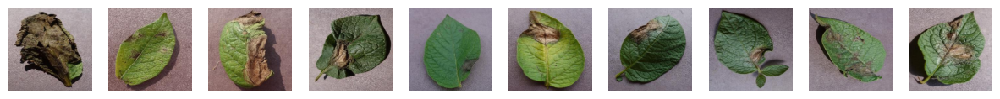

Potato___healthy


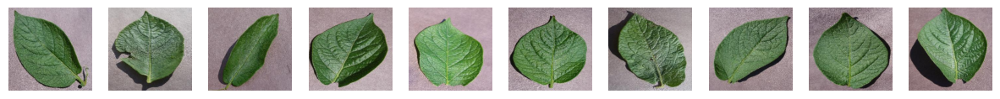

Raspberry___healthy


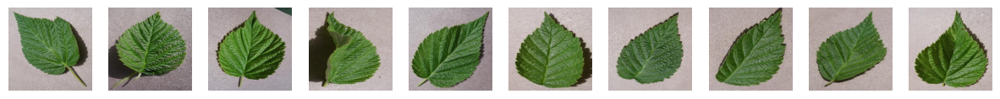

Soybean___healthy


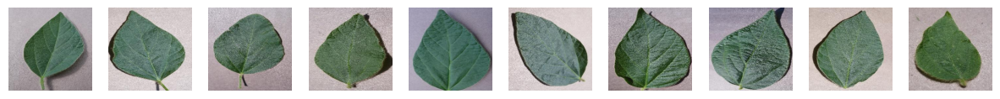

Squash___Powdery_mildew


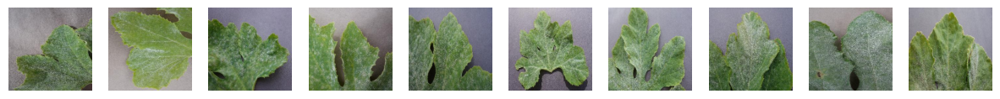

Strawberry___Leaf_scorch


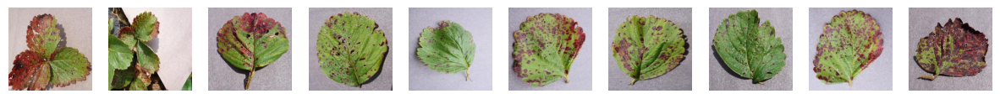

Strawberry___healthy


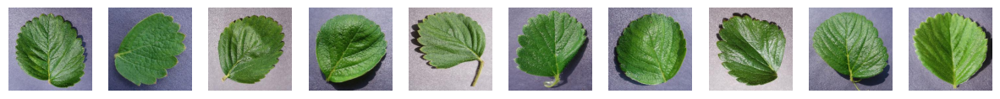

Tomato___Bacterial_spot


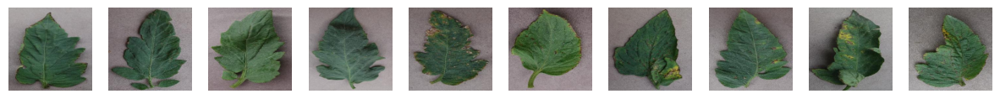

Tomato___Early_blight


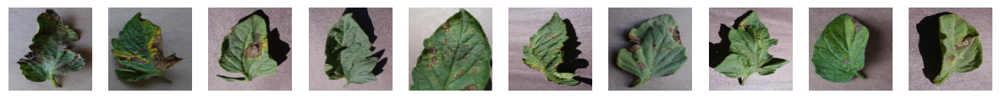

Tomato___Late_blight


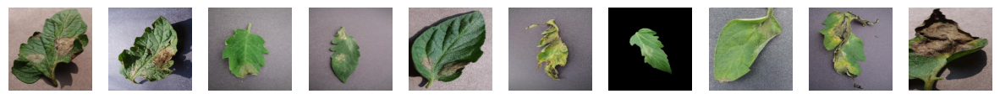

Tomato___Leaf_Mold


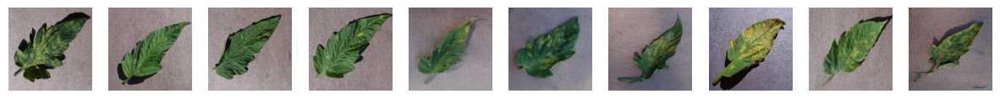

Tomato___Septoria_leaf_spot


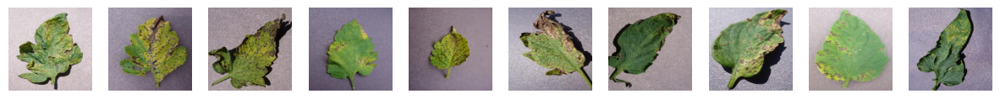

Tomato___Spider_mites Two-spotted_spider_mite


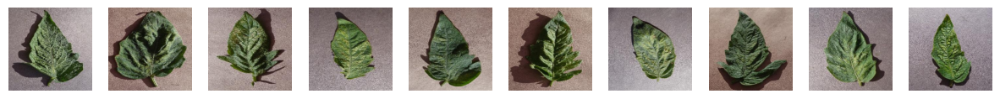

Tomato___Target_Spot


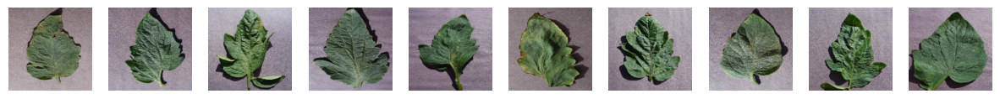

Tomato___Tomato_Yellow_Leaf_Curl_Virus


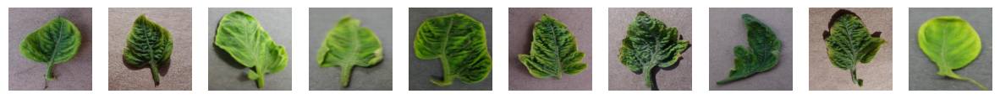

Tomato___Tomato_mosaic_virus


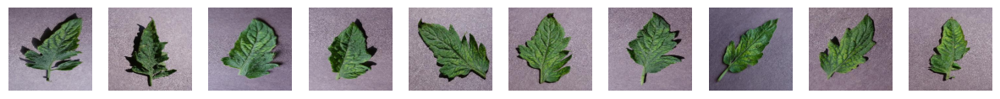

Tomato___healthy


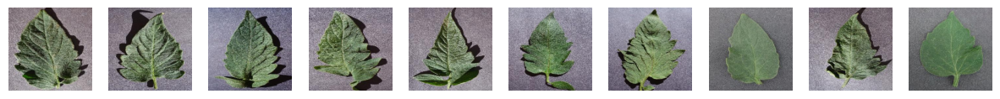

In [12]:
import random
from torchvision.transforms import v2           # usamos v2 porque es más rápido y presenta más capacidades

# Create a dictionary to store the image tensors by folder
img_data = {}
for img_path, label in dataset_color.samples:
    folder_name = dataset_color.classes[label]  # Gets the folder name from the dataset
    if folder_name not in img_data:
        img_data[folder_name] = []
    img_data[folder_name].append(img_path)

# Define the transformation
ToTensor_transform = v2.Compose([                   # Replace v1.ToTensor(): Convert images to tensor between [0,1] 
    v2.ToImage(),                                   
    v2.ToDtype(torch.float32, scale=True),                      
])

# Sample and display images
for i, folder in enumerate(img_data.keys()):
    print(folder)
    sample_size = 10
    # Ensure there are enough images in the folder
    if len(img_data[folder]) < sample_size:
        print(f"Not enough images in folder '{folder}' for sampling.")
        continue

    # Randomly sample image paths and apply transformations
    sampled_images = random.sample(img_data[folder], sample_size)
    
    # Note: This part still uses Image for loading but can be replaced depending on the available format
    tensors = [ToTensor_transform(datasets.folder.default_loader(path)) for path in sampled_images]

    # Create a grid of images
    plt.figure(figsize=(15, 5))
    for index, img_tensor in enumerate(tensors):
        plt.subplot(1, sample_size, index + 1)  # Create a subplot for each image
        plt.imshow(img_tensor.permute(1, 2, 0))  # Change tensor shape from (C, H, W) to (H, W, C)
        plt.axis('off')  # Hide axes

    plt.show()  # Display the images

**OBSERVACIONES:**

- En general, las que tienen una condición "Healthy", vemos que predomina enteramente el color verde, mientras que en los casos con enfermedad, se observan manchas o diferentes tonalidades (p.ej., amarillo). Con este criterio, vemos que considerar la imagen a color puede ser relevante para disernir el estado.

- Otro parámetro que se observa es que en las plantas enfermas, se observan "huecos". Alguna técnica de segmentación de bordes (p.ej., Canny) podría usarse para facilitar la clasificación.

Si lo que queremos ver es si la planta esta bien o no, sirve agrupar y hacer una clasificación binaria (Healthy / Disease):

In [13]:
# Find the indices of classes that match '___healthy' and those that don't
healthy_indices = [i for i, cls in enumerate(class_names) if '___healthy' in cls]
diseased_indices = [i for i, cls in enumerate(class_names) if '___healthy' not in cls]

# Count total images per class
class_counts = Counter(sample[1] for sample in dataset_color.samples)

# Sum counts for 'healthy' classes
healthy_total = sum(class_counts.get(idx, 0) for idx in healthy_indices)
# Sum counts for 'other' classes
diseased_total = sum(class_counts.get(idx, 0) for idx in diseased_indices)

print(f"Images labeled as 'healthy': {healthy_total}")
print(f"Images labeled as 'diseased': {diseased_total}")
print(f"Ratio 'healthy/diseased': {(healthy_total/diseased_total):.2f}")

Images labeled as 'healthy': 15084
Images labeled as 'diseased': 39221
Ratio 'healthy/diseased': 0.38


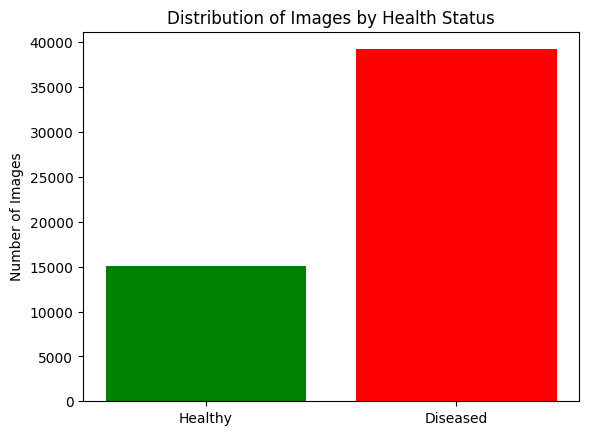

In [14]:
# Data for the bar chart
labels = ['Healthy', 'Diseased']
counts = [healthy_total, diseased_total]

# Create a bar plot with specified colors
plt.bar(labels, counts, color=['green', 'red'])

# Add labels and title
plt.ylabel('Number of Images')
plt.title('Distribution of Images by Health Status')

# Display the plot
plt.show()

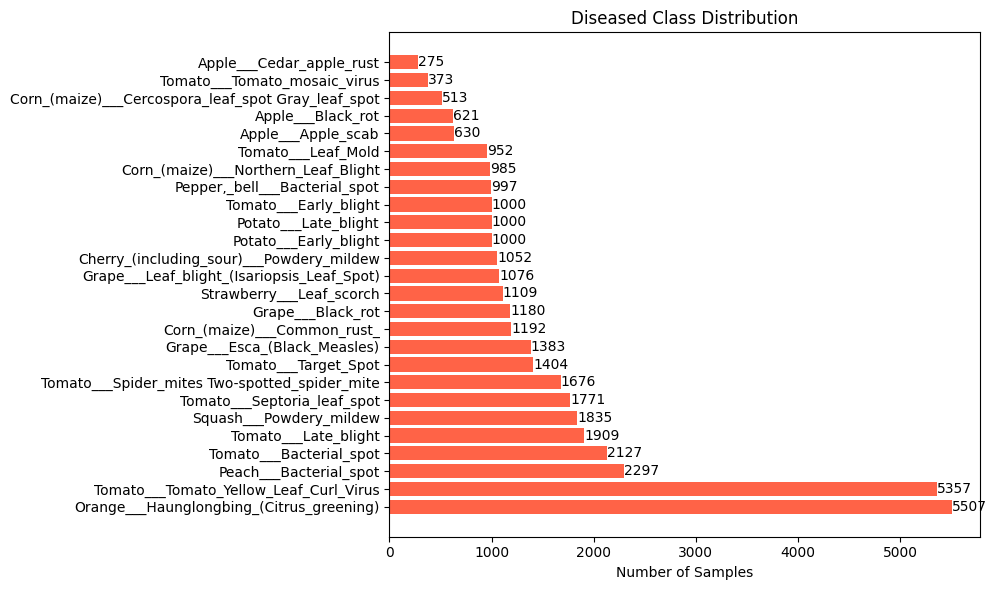

In [20]:
class_counts = Counter(sample[1] for sample in dataset_color.samples)

# Filter only diseased classes
diseased_class_counts = {
    class_names[cls]: count
    for cls, count in class_counts.items()
    if '___healthy' not in class_names[cls]
}

# Sort by count (optional)
diseased_class_counts = dict(sorted(diseased_class_counts.items(), key=lambda item: item[1], reverse=True))

# Plot
plt.figure(figsize=(10, 6))
bars = plt.barh(list(diseased_class_counts.keys()), list(diseased_class_counts.values()), color='tomato')
plt.xlabel('Number of Samples')
for bar in bars:
    width = bar.get_width()
    plt.text(width + 1, bar.get_y() + bar.get_height()/2, str(width), va='center')
plt.title('Diseased Class Distribution')
plt.tight_layout()
plt.show()

**OBSERVACIONES:**

- Como podemos ver hay algunos casos de enfermedades en los que se cuenta con pocos datos, es posible que para esto se tenga que generar algunas muestras, o la precision del modelo sea peor. 

Analizamos los histogramas de los canales.

In [15]:
def get_mean_channels(indices, dataset, num_images=100):
    r_means = []
    g_means = []
    b_means = []
    count = 0
    for sample in dataset.samples:
        label_idx = sample[1]
        if label_idx in indices:
            # cargar imagen
            image = dataset.loader(sample[0])
            if image is not None:
                img_array = np.array(image)
                # Asumiendo formato [H,W,C]
                r_mean = np.mean(img_array[:,:,0])
                g_mean = np.mean(img_array[:,:,1])
                b_mean = np.mean(img_array[:,:,2])
                r_means.append(r_mean)
                g_means.append(g_mean)
                b_means.append(b_mean)
                count += 1
                if count >= num_images:
                    break
    return r_means, g_means, b_means

Tomamos el dataset segmentado para independizarnos del fondo (valor 0).

In [16]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Get average channel values for 'healthy' cases
healthy_r, healthy_g, healthy_b = get_mean_channels(healthy_indices, dataset_seg)

# Get channels average values for 'diseased' cases
diseased_r, diseased_g, diseased_b = get_mean_channels(diseased_indices, dataset_seg)

# Plot histograms
fig = make_subplots(rows=3, cols=2, subplot_titles=(
    "Healthy", "Diseased",
))
def add_distplot(fig, data, row, col, color):
    dist = go.Histogram(
        x=data,
        nbinsx=20,
        marker_color=color,
        opacity=0.75,
        showlegend=False
    )
    fig.add_trace(dist, row=row, col=col)

# Agregar los gráficos a la figura
add_distplot(fig, healthy_r, 1, 1, 'red')
add_distplot(fig, diseased_r, 1, 2, 'darkred')
add_distplot(fig, healthy_g, 2, 1, 'green')
add_distplot(fig, diseased_g, 2, 2, 'darkgreen')
add_distplot(fig, healthy_b, 3, 1, 'blue')
add_distplot(fig, diseased_b, 3, 2, 'darkblue')

x_range_row1 = [min(healthy_r + diseased_r), max(healthy_r + diseased_r)]
x_range_row2 = [min(healthy_g + diseased_g), max(healthy_g + diseased_g)]
x_range_row3 = [min(healthy_b + diseased_b), max(healthy_b + diseased_b)]

fig.update_xaxes(range=x_range_row1, row=1, col=1)
fig.update_xaxes(range=x_range_row1, row=1, col=2)

fig.update_xaxes(range=x_range_row2, row=2, col=1)
fig.update_xaxes(range=x_range_row2, row=2, col=2)

fig.update_xaxes(range=x_range_row3, row=3, col=1)
fig.update_xaxes(range=x_range_row3, row=3, col=2)

# Show
fig.update_layout(
    height=900,
    width=1000,
    title_text="Distribution of Average Channel Values (Healthy vs Diseased)",
    template="simple_white"
)
fig.show()

ModuleNotFoundError: No module named 'plotly'

**OBSERVACIONES:**

- Para los casos "healthy", las distribuciones de los 3 canales siguen una distribución gaussiana.

-  Se observa un leve aumento de la importancia del canal rojo en los casos "diseased". Esto es congruente con el hecho de que plantas con patologías presentan colores rojos/amarillentos.

In [ ]:
fig = make_subplots(
    rows=1,
    cols=2,
    subplot_titles=("Healthy", "Diseased"),
    shared_yaxes=True
)

# Listas de valores y nombres de canales
healthy_values = [healthy_r, healthy_g, healthy_b]
diseased_values = [diseased_r, diseased_g, diseased_b]
colors = ['Red', 'Green', 'Blue']

# Añadimos boxplots para "healthy"
for idx, values in enumerate(healthy_values):
    fig.add_trace(
        go.Box(
            y=values,
            name=colors[idx],
            boxpoints='outliers',
            marker=dict(color=colors[idx].lower()),
            showlegend=False  # Para que no dupliquen la leyenda
        ),
        row=1,
        col=1
    )

# Añadimos boxplots para "diseased"
for idx, values in enumerate(diseased_values):
    fig.add_trace(
        go.Box(
            y=values,
            name=colors[idx],
            boxpoints='outliers',
            marker=dict(color=colors[idx].lower()),
            showlegend=False
        ),
        row=1,
        col=2
    )

# Actualizar el layout
fig.update_layout(
    height=400,
    width=900,
    yaxis_title="Mean value",
    boxmode='group',
    title_text="Mean value vs. Color channel (Healthy vs. Diseased)"
)

fig.show()

**OBSERVACIONES:**

- Se ve una mayor predominancia del verde, como era de espesrarse por tratarse de hojas, seguido por el rojo y el azul, respectivamente.

### 2. MODELLING (IN PROGRESS)

#### 2.1 DATASET TRANSFORM

Generamos un dataset con una mezcla aleatoria de las versiones ('color', 'grayscale', 'segmented'), donde para cada instancia, seleccionamos aleatoriamente de cada uno de los 3 datasets. Al mismo tiempo que mantenemos constante el tamaño del dataset (es decir, consumimos menos recursos computacionales), esperamos que el modelo generalize mejor con esta estrategia.

Posteriormente, Convertimos el problema a clasificación binaria donde las opciones son si la planta esta sana ('Healthy') o presenta patología ('Diseased').

In [ ]:
from torch.utils.data import Dataset
from torchvision.transforms import v2           # usamos v2 porque es más rápido y presenta más capacidades

# Define the transformation
ToTensor_transform = v2.Compose([               # Replace v1.ToTensor(): Convert images to tensor between [0,1] 
    v2.ToImage(),                                   
    v2.ToDtype(torch.float32, scale=True),                      
])

class TransformDataset(Dataset):
    def __init__(self, datasets_list, seed=42, class_mapping=None, transform=None):
        self.datasets = datasets_list
        self.length = len(self.datasets[0])  # Tomamos la longitud del primer dataset como válida
        self.seed = seed
        self.class_mapping = class_mapping
        self.transform = transform  # Agregamos el argumento de la transformación

    def __len__(self):
        return self.length

    def __getitem__(self, idx):
        import random
        random.seed(self.seed + idx)
        chosen_dataset = random.choice(self.datasets)
        image, label_idx = chosen_dataset[idx]
        # Aplico la transformación si existe
        if self.transform:
            image = self.transform(image)
        # Convertir label si se especifica
        if self.class_mapping is not None:
            label_name = class_names[label_idx]
            label_category = self.class_mapping[label_name]
        else:
            label_category = label_name
        return image, label_category

# Convertimos el problema a clasificación binaria.
# 0 -> Healthy
# 1 -> Diseased
class_mapping = {
    class_name: 0 if '__healthy' in class_name else 1
    for class_name in class_names
}

# Crear tu nuevo dataset con etiquetas convertidas
rnd_seed = 42
dataset = TransformDataset([dataset_color, dataset_gray, dataset_seg], 
                           seed=rnd_seed, 
                           class_mapping = class_mapping,
                           transform = ToTensor_transform)
ndata = len(dataset)

#### 2.2 TRAIN, VALIDATION & TEST SPLIT

In [ ]:
# Definimos fracciones para train/validation/test
val_size = 0.20
test_size = 0.20

# Calculamos la cantidad de elementos de cada set
nval = int(val_size * ndata)
ntest = int(test_size * ndata)
ntrain = ndata - (nval + ntest)

# Generamos los sets
generator = torch.Generator().manual_seed(rnd_seed)
train_data, val_data, test_data = torch.utils.data.random_split(dataset, [ntrain, nval, ntest], generator = generator)

print("Dimension del set de train:", ntrain)
print("Dimension del set de validation:", nval)
print("Dimension del set de test:", ntest)
print("")
print(f"Fracción de datos de train: {1 - (val_size + test_size):.2f}")
print(f"Fracción de datos de validation: {val_size:.2f}")
print(f"Fracción de datos de test: {test_size:.2f}")

Dimension del set de train: 32583
Dimension del set de validation: 10861
Dimension del set de test: 10861

Fracción de datos de train: 0.60
Fracción de datos de validation: 0.20
Fracción de datos de test: 0.20


In [ ]:
def get_set_normalize_params(dataset, batch_size=64, seed=42):

    # get a random sample
    random.seed(seed)
    sample_indices = random.sample(range(len(dataset)), batch_size)
    
    all_pixels = []

    for idx in sample_indices:
        img, _ = dataset[idx]
        img = ToTensor_transform(img)
        all_pixels.append(img.reshape(-1))
    
    # Concatenar los píxeles del batch
    all_pixels_tensor = torch.cat(all_pixels)

    # Calcular media y std
    mean = all_pixels_tensor.mean().item()
    std = all_pixels_tensor.std().item()

    print(f'Media: {mean:.2g}')
    print(f'Desviación estándar: {std:.2g}')

    return mean, std

# Cargar el conjunto de entrenamiento sin aplicar transform (para calculo de mean y std)
# Consideramos diferentes batchs
mean_std = []
batch_list = [64, 128, 256, 512, 1028]
for bsize in batch_list:
    print(f'Batch size: {bsize}')
    mean_std.append(get_set_normalize_params(train_data, batch_size = bsize))
    print("")

# Recover las value
mean = mean_std[-1][0]
std = mean_std[-1][1]

Batch size: 64
Media: 0.4
Desviación estándar: 0.24

Batch size: 128
Media: 0.39
Desviación estándar: 0.24

Batch size: 256
Media: 0.38
Desviación estándar: 0.25

Batch size: 512
Media: 0.38
Desviación estándar: 0.24

Batch size: 1028
Media: 0.38
Desviación estándar: 0.24



In [ ]:
in_width = int((min_width + max_width) / 2)
in_height = int((min_height + max_height) / 2)

# Definir transformaciones
# Transformación a todas las imagenes
transform = v2.Compose([
    v2.Resize((in_width, in_height)),                           # Resize images (just in case)
    ToTensor_transform,                                         # Convert to Tensor
    v2.Normalize(mean=[mean], std=[std]),                       # Normalize channel
    ])

#### 2.3 DATA AUGMENTATION (IN PROGRESS)

Para hacer *data augmentation*, como primer aproximación, aprovechamos la funcionalidad *transforms*. En particular, aplicamos la técnica *RandAument*.

Este método necesita que se le especifiquen 2 parámetros: 

- N:    Número transformaciones a aplicar secuencialmente.
- M:    Magnitud de todas las transformaciones. Valor entre [1, 10], donde 10 indica la máxima escala para una transformación dada.

Se pueden aplicar 14 tipos de transformaciones disponibles:

- identity
- rotate 
- posterize
- sharpness
- translate-x
- autoContrast
- solarize 
- contrast 
- shear-x 
- translate-y 
- equalize 
- color 
- brightness
- shear-y

Más precisiones se pueden encontrar en Cubuk et. al. (2019),"RandAugment: Practical automated data augmentation with a reduced search space", 	arXiv:1909.13719, https://doi.org/10.48550/arXiv.1909.13719.

In [ ]:
# Transformación para data augmentation
N = 3
M = 4
data_aug_transforms = v2.Compose([
                        v2.RandAugment(num_ops=N, magnitude=M),
                        ToTensor_transform
    ])

#### 2.4 DATA LOADER

In [ ]:
batch_size = 32

# Cargamos los sets
train_loader = torch.utils.data.DataLoader(train_data, batch_size = batch_size, shuffle = True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size = batch_size, shuffle = False)
test_loader = torch.utils.data.DataLoader(test_data, batch_size = batch_size, shuffle = False)

In [ ]:
for images, labels in train_loader:
    print(images.shape)  # Imprime la forma de las imágenes
    print(labels)        # Imprime las etiquetas (números enteros codificados)
    break  # Salir después del primer lote

torch.Size([32, 3, 256, 256])
tensor([1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
        0, 0, 1, 1, 1, 1, 1, 0])


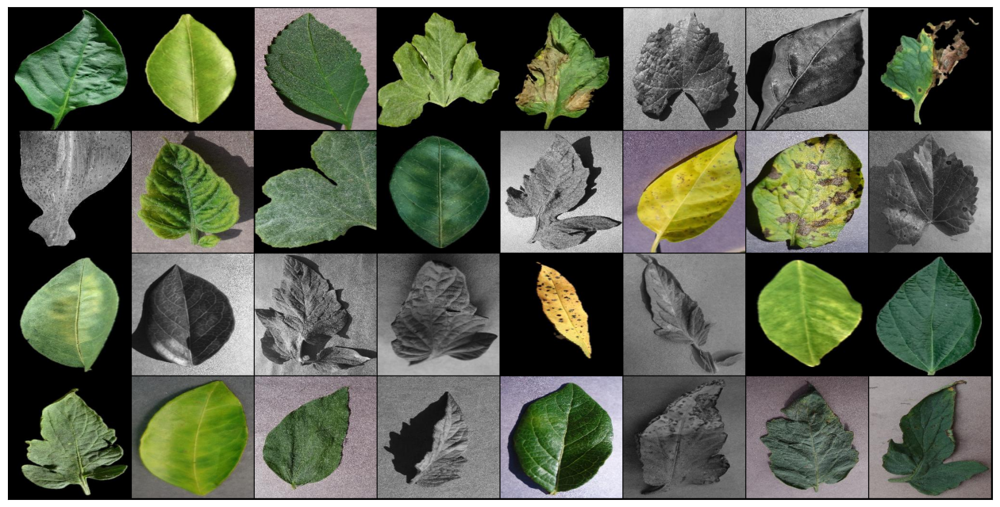

In [ ]:
from torchvision.utils import make_grid

def show_batch(dl):
    """Plot images grid of single batch"""
    for images, labels in dl:
        fig,ax = plt.subplots(figsize = (16,12))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(make_grid(images,nrow=8).permute(1,2,0))
        break
        
show_batch(train_loader)

#### 2.5 BASELINE MODEL (IN PROGRESS)